## Capston Project 

<li>We are required to submit the following :</li>


<li> 1) A description of the problem and a discussion of the background. (15 marks)</li> 
<li>2) A description of the data and how it will be used to solve the problem. (15 marks) </li>
<li>3) A link to your Notebook on your Github repository, showing your code. (15 marks)</li>
<li>4) A full report consisting of all of the following components (15 marks):</li>
<li>3. Your choice of a presentation or blogpost. (10 marks).

## Introduction 

As known, London is considered one of the most important, expensive and visited city in the globe. It has diverse cultures with various races and demographics. In short, London is a mix of everything and we can write uncountable pages describing its culture, history and economy. Thus, in this project, I will address the issue of moving to the city of London as an expat or as an international students or any other reasons that make you move to London. I will consider some criteria in listing the best boroughs to live or to work or to study based on safety measurment, average renting rate. Besides, I will address the population rate in each boroughs for further measuremnt and analysis. Once again, my concentration is the safety and the renting rate.Furthermore, I did not point out about the transportation services or the entertainment venues since, I do belive that London is a well linked city in terms of transportation services and with that it will be easy to reach entertaining venues through varoius transportaion services that the city provides to its people and visitors.  

#### Business Problem:

 The problem is to precisely find the best place that possess the two criteria since it is only figure of the last two years and did not address in depth the kind of crimes or the category of accomodation based on specific details. the study is limited to period of time and it is exposed to differnt changes that casues a deacresing the crimes rates or even the rentig rates

#### Targeted Audience

For everyone who wants to move and live in a megacity in general, and for tourists and visitors who are looking for special criteria based on their preferences. More specifically, for those heading to London in the near Future.



#### Data needed:

<li>The needed data For this case are as the following:</li>
<li>1)	List of Boroughs and neighborhoods of city of London with their geodata (latitude and longitude) and thier population.</li>
<li>2)	List of crimes in London’s boroughs with their addresses. </li>  
<li>3) List of boroughs with home renting prices (least cost)</li> 


#### How to use the data

<li> The data will be used as follows:</li>
<li> 1) Use Foursquare and geopy to map boroughs with their latitude and longitude.</li>
<li> 2) Use data visualisation libraries to map the location of broughs of London according to the crime rates</li>
<li> 3) Use data visualisation libraries to map the location of broughs of London according to the accommodation renting prices.</li> 
<li> 4) Use Foursquare to get the most common venues in each boroughs.</li> 
<li> 5) list and map the best boroughs to live according to the previous places.</li>


In [1]:
# import libraries
import numpy as np # library to handle data in a vectorized manner
import time
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
!pip install bs4
!pip install lxml
!pip install xlrd
!pip install html5lib
import lxml 
import xlrd
import pandas as pd
from bs4 import BeautifulSoup 
import json # library to handle JSON files
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
!pip install folium 
# uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
print ('folium installed')
print('Libraries imported.')

You should consider upgrading via the 'python -m pip install --upgrade pip' command.


You should consider upgrading via the 'python -m pip install --upgrade pip' command.


You should consider upgrading via the 'python -m pip install --upgrade pip' command.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


You should consider upgrading via the 'python -m pip install --upgrade pip' command.


folium installed
Libraries imported.


#### 1) List of Boroughs and neighborhoods of city of London with their geodata (latitude and longitude).</li>
Import a list of London's Boroughs with thier respective long and lat.

In [3]:
# I will soup a wiki page about list of boroughs in London 
source = requests.get('https://en.wikipedia.org/wiki/List_of_London_boroughs').text
soup = BeautifulSoup(source, 'lxml')
soup.encode("utf-8-sig")
# start making the basis of the dataframe
BoroughName = []
Population = []
Coordinates = []

for row in soup.find('table').find_all('tr'):
    cells = row.find_all('td')
    if len(cells) > 0:
        BoroughName.append(cells[0].text.rstrip('\n'))
        Population.append(cells[7].text.rstrip('\n'))
        Coordinates.append(cells[8].text.rstrip('\n'))

In [4]:
# Form a dataframe
dict = {'BoroughName' : BoroughName,
       'Population' : Population,
       'Coordinates': Coordinates}
info = pd.DataFrame.from_dict(dict)
info.head()

,BoroughName,Population,Coordinates
0,Barking and Dagenham [note 1],"194,352",51°33′39″N 0°09′21″E﻿ / ﻿51.5607°N 0.1557°E﻿ /...
1,Barnet,"369,088",51°37′31″N 0°09′06″W﻿ / ﻿51.6252°N 0.1517°W﻿ /...
2,Bexley,"236,687",51°27′18″N 0°09′02″E﻿ / ﻿51.4549°N 0.1505°E﻿ /...
3,Brent,"317,264",51°33′32″N 0°16′54″W﻿ / ﻿51.5588°N 0.2817°W﻿ /...
4,Bromley,"317,899",51°24′14″N 0°01′11″E﻿ / ﻿51.4039°N 0.0198°E﻿ /...


In [5]:
# Strip unwanted texts
info['BoroughName'] = info['BoroughName'].map(lambda x: x.rstrip(']'))
info['BoroughName'] = info['BoroughName'].map(lambda x: x.rstrip('1234567890.'))
info['BoroughName'] = info['BoroughName'].str.replace('note','')
info['BoroughName'] = info['BoroughName'].map(lambda x: x.rstrip(' ['))
info.head()

,BoroughName,Population,Coordinates
0,Barking and Dagenham,"194,352",51°33′39″N 0°09′21″E﻿ / ﻿51.5607°N 0.1557°E﻿ /...
1,Barnet,"369,088",51°37′31″N 0°09′06″W﻿ / ﻿51.6252°N 0.1517°W﻿ /...
2,Bexley,"236,687",51°27′18″N 0°09′02″E﻿ / ﻿51.4549°N 0.1505°E﻿ /...
3,Brent,"317,264",51°33′32″N 0°16′54″W﻿ / ﻿51.5588°N 0.2817°W﻿ /...
4,Bromley,"317,899",51°24′14″N 0°01′11″E﻿ / ﻿51.4039°N 0.0198°E﻿ /...


In [6]:
# Clean coordinates
info[['Coordinates1','Coordinates2','Coordinates3']] = info['Coordinates'].str.split('/',expand=True)
info.head()

,BoroughName,Population,Coordinates,Coordinates1,Coordinates2,Coordinates3
0,Barking and Dagenham,"194,352",51°33′39″N 0°09′21″E﻿ / ﻿51.5607°N 0.1557°E﻿ /...,51°33′39″N 0°09′21″E﻿,﻿51.5607°N 0.1557°E﻿,51.5607; 0.1557﻿ (Barking and Dagenham)
1,Barnet,"369,088",51°37′31″N 0°09′06″W﻿ / ﻿51.6252°N 0.1517°W﻿ /...,51°37′31″N 0°09′06″W﻿,﻿51.6252°N 0.1517°W﻿,51.6252; -0.1517﻿ (Barnet)
2,Bexley,"236,687",51°27′18″N 0°09′02″E﻿ / ﻿51.4549°N 0.1505°E﻿ /...,51°27′18″N 0°09′02″E﻿,﻿51.4549°N 0.1505°E﻿,51.4549; 0.1505﻿ (Bexley)
3,Brent,"317,264",51°33′32″N 0°16′54″W﻿ / ﻿51.5588°N 0.2817°W﻿ /...,51°33′32″N 0°16′54″W﻿,﻿51.5588°N 0.2817°W﻿,51.5588; -0.2817﻿ (Brent)
4,Bromley,"317,899",51°24′14″N 0°01′11″E﻿ / ﻿51.4039°N 0.0198°E﻿ /...,51°24′14″N 0°01′11″E﻿,﻿51.4039°N 0.0198°E﻿,51.4039; 0.0198﻿ (Bromley)


In [7]:
info.drop(labels=['Coordinates','Coordinates1','Coordinates2'], axis=1,inplace = True)
info[['Latitude','Longitude']] = info['Coordinates3'].str.split(';',expand=True)
info.head()

,BoroughName,Population,Coordinates3,Latitude,Longitude
0,Barking and Dagenham,"194,352",51.5607; 0.1557﻿ (Barking and Dagenham),51.5607,0.1557﻿ (Barking and Dagenham)
1,Barnet,"369,088",51.6252; -0.1517﻿ (Barnet),51.6252,-0.1517﻿ (Barnet)
2,Bexley,"236,687",51.4549; 0.1505﻿ (Bexley),51.4549,0.1505﻿ (Bexley)
3,Brent,"317,264",51.5588; -0.2817﻿ (Brent),51.5588,-0.2817﻿ (Brent)
4,Bromley,"317,899",51.4039; 0.0198﻿ (Bromley),51.4039,0.0198﻿ (Bromley)


In [8]:
info.drop(labels=['Coordinates3'], axis=1,inplace = True)
info['Latitude'] = info['Latitude'].map(lambda x: x.rstrip(u'\ufeff'))
info['Latitude'] = info['Latitude'].map(lambda x: x.lstrip())
info['Longitude'] = info['Longitude'].map(lambda x: x.rstrip(')'))
info['Longitude'] = info['Longitude'].map(lambda x: x.rstrip('abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ '))
info['Longitude'] = info['Longitude'].map(lambda x: x.rstrip(' ('))
info['Longitude'] = info['Longitude'].map(lambda x: x.rstrip(u'\ufeff'))
info['Longitude'] = info['Longitude'].map(lambda x: x.lstrip())
info['Population'] = info['Population'].str.replace(',','')
info.head()

,BoroughName,Population,Latitude,Longitude
0,Barking and Dagenham,194352,51.5607,0.1557
1,Barnet,369088,51.6252,-0.1517
2,Bexley,236687,51.4549,0.1505
3,Brent,317264,51.5588,-0.2817
4,Bromley,317899,51.4039,0.0198


In [9]:
info['BoroughName'].unique()

array(['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley',
       'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Hackney',
       'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering',
       'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea',
       'Kingston upon Thames', 'Lambeth', 'Lewisham', 'Merton', 'Newham',
       'Redbridge', 'Richmond upon Thames', 'Southwark', 'Sutton',
       'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster'],
      dtype=object)

In [10]:
# Foursquare credentials
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180605'


In [11]:
#Create a function to explore all borough
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['BoroughName', 
                  'Borough Latitude', 
                  'Borough Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [12]:
#Get top 50 venues in 500m radius of the center of each Borough
LIMIT = 50
venues = getNearbyVenues(names=info['BoroughName'],
                                   latitudes=info['Latitude'],
                                   longitudes=info['Longitude']
                                  )

Barking and Dagenham
Barnet
Bexley
Brent
Bromley
Camden
Croydon
Ealing
Enfield
Greenwich
Hackney
Hammersmith and Fulham
Haringey
Harrow
Havering
Hillingdon
Hounslow
Islington
Kensington and Chelsea
Kingston upon Thames
Lambeth
Lewisham
Merton
Newham
Redbridge
Richmond upon Thames
Southwark
Sutton
Tower Hamlets
Waltham Forest
Wandsworth
Westminster


In [13]:
print(venues.shape)

(1140, 7)


#### 2) List of crimes in London’s boroughs with their addresses:
In this section i will import the data of crimes in london

In [14]:
# Read crime records data for the last 24 months 
crime = pd.read_csv(r"C:\Users\dalal\Downloads\crimes.csv")
crime.head(5)


,maj,min,BoroughName,201805,201806,201807,201808,201809,201810,201811,201812,201901,201902,201903,201904,201905,201906,201907,201908,201909,201910,201911,201912,202001,202002,202003,202004
0,Arson and Criminal Damage,Arson,Barking and Dagenham,4,12,6,5,3,8,5,1,5,2,5,5,11,3,5,3,6,9,8,6,4,5,6,2
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,126,123,127,101,107,132,105,88,97,127,138,130,139,113,134,118,109,109,97,121,97,103,108,82
2,Burglary,Burglary - Business and Community,Barking and Dagenham,24,33,30,18,33,32,39,33,45,24,29,27,22,27,31,35,37,30,30,25,31,17,27,29
3,Burglary,Burglary - Residential,Barking and Dagenham,93,77,94,84,99,94,106,164,114,107,99,96,114,96,71,67,80,97,114,130,116,123,97,56
4,Drug Offences,Drug Trafficking,Barking and Dagenham,8,6,8,7,10,7,7,4,5,2,6,5,9,6,11,7,7,10,12,3,11,3,6,9


In [15]:
crime.shape

(1567, 27)

In [16]:
# Names of Boroughs
crime['BoroughName'].unique()

array(['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley',
       'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Hackney',
       'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering',
       'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea',
       'Kingston upon Thames', 'Lambeth', 'Lewisham',
       'London Heathrow and London City Airports', 'Merton', 'Newham',
       'Redbridge', 'Richmond upon Thames', 'Southwark', 'Sutton',
       'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster'],
      dtype=object)

In [17]:
# add new columns that sum up the 24 incident in each Borough
crime['sum']=crime.iloc[:,3:27].sum(axis=1)
crimesum=crime['sum']
crime.drop(labels=['sum'], axis=1, inplace= True)
crime.insert(3, 'sum',crimesum)
crime.head(5)

,maj,min,BoroughName,sum,201805,201806,201807,201808,201809,201810,201811,201812,201901,201902,201903,201904,201905,201906,201907,201908,201909,201910,201911,201912,202001,202002,202003,202004
0,Arson and Criminal Damage,Arson,Barking and Dagenham,129,4,12,6,5,3,8,5,1,5,2,5,5,11,3,5,3,6,9,8,6,4,5,6,2
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,2731,126,123,127,101,107,132,105,88,97,127,138,130,139,113,134,118,109,109,97,121,97,103,108,82
2,Burglary,Burglary - Business and Community,Barking and Dagenham,708,24,33,30,18,33,32,39,33,45,24,29,27,22,27,31,35,37,30,30,25,31,17,27,29
3,Burglary,Burglary - Residential,Barking and Dagenham,2388,93,77,94,84,99,94,106,164,114,107,99,96,114,96,71,67,80,97,114,130,116,123,97,56
4,Drug Offences,Drug Trafficking,Barking and Dagenham,169,8,6,8,7,10,7,7,4,5,2,6,5,9,6,11,7,7,10,12,3,11,3,6,9


In [18]:
# make a table that has two columns of Borough name and number of crimes 
crime.drop(crime.columns[0:2], axis=1, inplace=True)
crime.drop(crime.columns[2:27], axis=1, inplace=True)
crime.head()

,BoroughName,sum
0,Barking and Dagenham,129
1,Barking and Dagenham,2731
2,Barking and Dagenham,708
3,Barking and Dagenham,2388
4,Barking and Dagenham,169


In [19]:
# Calculate sum of incidents in each Borough for the last 24 months
crime=crime.groupby(['BoroughName'], as_index=False).sum()
crime.head(5)

,BoroughName,sum
0,Barking and Dagenham,38786
1,Barnet,59877
2,Bexley,33907
3,Brent,60584
4,Bromley,48235


In [20]:
# Change the sum into monthly average
crime['sum'] = crime['sum']/24
crime.rename(columns={crime.columns[1]:'MonthlyAverage'}, inplace=True)
crime.head(30)

,BoroughName,MonthlyAverage
0,Barking and Dagenham,1616.083333
1,Barnet,2494.875000
2,Bexley,1412.791667
3,Brent,2524.333333
4,Bromley,2009.791667
5,Camden,3117.750000
6,Croydon,2748.791667
7,Ealing,2525.083333
8,Enfield,2454.000000
9,Greenwich,2293.750000


##### 2) Done with the list of of crimes above.



##### 3) List of rental prices in each Borough in London:
The imported data will represent all the categories of accomodations (room, studio..) for more ease with average prices from 2018 till 2019 for each Borough.


In [21]:
# with the folowing codes we will import a data about renting prices 
rent = pd.read_excel(r"C:\Users\dalal\OneDrive\Desktop\renting.xls", sheet_name='Rent')
rent.head()

,Year,Quarter,Code,Area,Category,Count of rents,Average,Lower quartile,Median,Upper quartile
0,2018,Q1,E09000002,Barking and Dagenham,All categories,780,1184,1000,1200,1350
1,2018,Q1,E09000003,Barnet,All categories,2100,1508,1158,1350,1690
2,2018,Q1,E09000004,Bexley,All categories,770,1044,850,1023,1200
3,2018,Q1,E09000005,Brent,All categories,2020,1571,1235,1480,1800
4,2018,Q1,E09000006,Bromley,All categories,1520,1226,965,1150,1380


In [22]:
#drp unnecessery columns 
rent.drop(rent.columns[0:3], axis=1, inplace= True)
rent.drop(rent.columns[1:3], axis=1, inplace= True)
rent.drop(rent.columns[2:5], axis=1, inplace=True)
rent

,Area,Average
0,Barking and Dagenham,1184
1,Barnet,1508
2,Bexley,1044
3,Brent,1571
4,Bromley,1226
5,Camden,1961
6,Croydon,1144
7,Ealing,1514
8,Enfield,1324
9,Greenwich,1434


In [23]:
#Sum the average cost of renting for each boroughs from 2018 to the first quarter of 2019
Borough_rent= rent.groupby(['Area'], as_index=False).sum() #Area is Borough dont mix up ;}
Borough_rent


,Area,Average
0,Barking and Dagenham,3569
1,Barnet,4591
2,Bexley,3154
3,Brent,4731
4,Bromley,3794
5,Camden,6505
6,Croydon,3389
7,Ealing,4530
8,Enfield,4006
9,Greenwich,4206


##### Done with avg rent for each of London Boroughs 


#### So our data is prepard for further analysis :

### Methedology:

In this section, we are going to visualize the data. Then, we will br going to conduct cluster analysis to classify the boroughs into different levels of preference.
So let us double check with our data after being arranged and deployed:

In [24]:
#list of Boroughs with population , long and lat
info.head(10)

,BoroughName,Population,Latitude,Longitude
0,Barking and Dagenham,194352,51.5607,0.1557
1,Barnet,369088,51.6252,-0.1517
2,Bexley,236687,51.4549,0.1505
3,Brent,317264,51.5588,-0.2817
4,Bromley,317899,51.4039,0.0198
5,Camden,229719,51.5290,-0.1255
6,Croydon,372752,51.3714,-0.0977
7,Ealing,342494,51.5130,-0.3089
8,Enfield,320524,51.6538,-0.0799
9,Greenwich,264008,51.4892,0.0648


In [25]:
#list of crimes in each boroughs for on monthly basis
crime.head(5)

,BoroughName,MonthlyAverage
0,Barking and Dagenham,1616.083333
1,Barnet,2494.875000
2,Bexley,1412.791667
3,Brent,2524.333333
4,Bromley,2009.791667


In [26]:
#list of borough based on avg rent for all categories of accomodation 
Borough_rent.head(10)

,Area,Average
0,Barking and Dagenham,3569
1,Barnet,4591
2,Bexley,3154
3,Brent,4731
4,Bromley,3794
5,Camden,6505
6,Croydon,3389
7,Ealing,4530
8,Enfield,4006
9,Greenwich,4206


In [27]:
import matplotlib.pyplot as plt
#Drop Heathrow Airport as it is not a residential area & not included in population data
crime.drop([22], inplace=True)

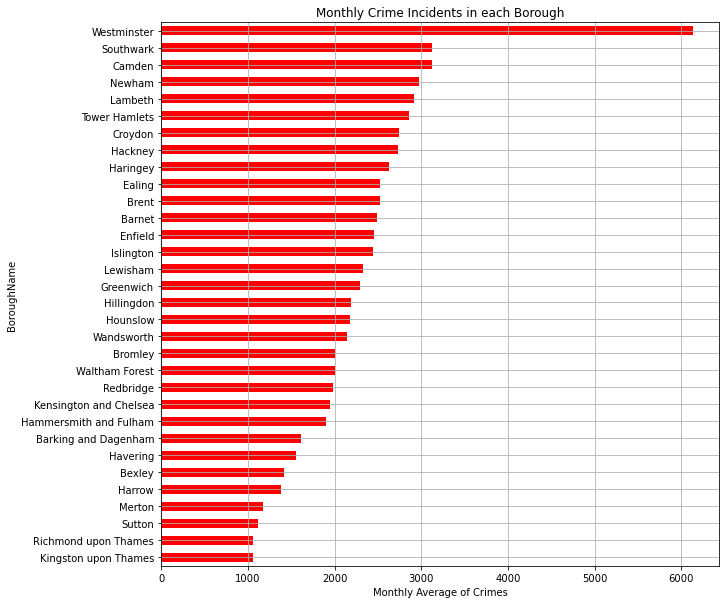

In [28]:
#Visualize crime data
crime.set_index('BoroughName')['MonthlyAverage'].sort_values().plot(kind='barh', grid=True, figsize=(10,10), color='red')
plt.xlabel('Monthly Average of Crimes')
plt.title('Monthly Crime Incidents in each Borough')
plt.show()

Despite, the type of crime wether it is major ot minor incident. It seems that,<b>Westminster</b> has the highest number of incidents followed by Camden, Southwark and Newham

In [29]:
#Combine crime data and borough information data
df = pd.merge(crime,info, how='outer', on='BoroughName')
df.head()


,BoroughName,MonthlyAverage,Population,Latitude,Longitude
0,Barking and Dagenham,1616.083333,194352,51.5607,0.1557
1,Barnet,2494.875000,369088,51.6252,-0.1517
2,Bexley,1412.791667,236687,51.4549,0.1505
3,Brent,2524.333333,317264,51.5588,-0.2817
4,Bromley,2009.791667,317899,51.4039,0.0198


In [30]:
#Check data type
df.dtypes

BoroughName        object
MonthlyAverage    float64
Population         object
Latitude           object
Longitude          object
dtype: object

In [31]:
df['Population'] = pd.to_numeric(df['Population'])
df['Latitude'] = pd.to_numeric(df['Latitude'])
df['Longitude'] = pd.to_numeric(df['Longitude'])
df.dtypes

BoroughName        object
MonthlyAverage    float64
Population          int64
Latitude          float64
Longitude         float64
dtype: object

In [32]:
df.shape

(32, 5)

In [33]:
# Make a column that shows number of crimes per 1000 people per month
df['Population'].astype(float)
df['CrimeToPop'] = df['MonthlyAverage'] / df['Population'] * 1000
df.head()


,BoroughName,MonthlyAverage,Population,Latitude,Longitude,CrimeToPop
0,Barking and Dagenham,1616.083333,194352,51.5607,0.1557,8.315239
1,Barnet,2494.875000,369088,51.6252,-0.1517,6.759567
2,Bexley,1412.791667,236687,51.4549,0.1505,5.969029
3,Brent,2524.333333,317264,51.5588,-0.2817,7.956570
4,Bromley,2009.791667,317899,51.4039,0.0198,6.322108


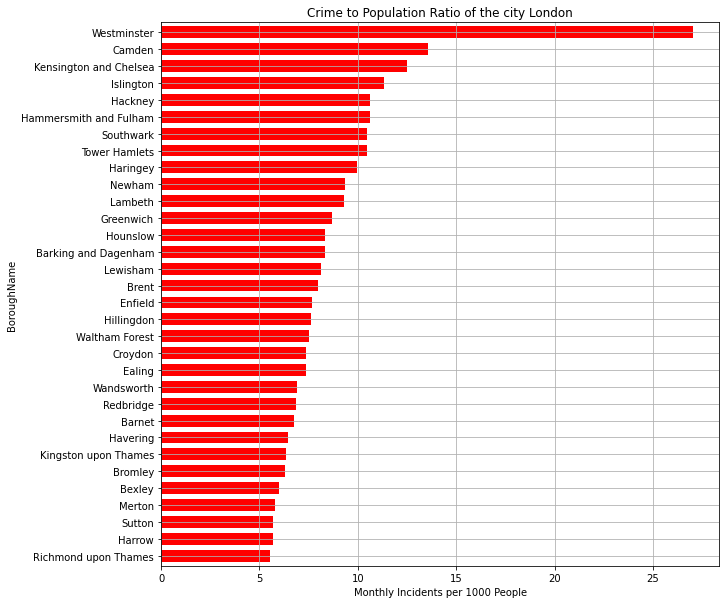

In [34]:
#Visualize crime per 1000 people
df.set_index('BoroughName')['CrimeToPop'].sort_values().plot(kind='barh', grid=True, figsize=(10,10), width=0.7, color='red')
plt.xlabel('Monthly Incidents per 1000 People')
plt.title('Crime to Population Ratio of the city London')
plt.show()

In [35]:
import folium
from geopy.geocoders import Nominatim

In [36]:
#Get coordinates of London
address = 'London, UK'

geolocator = Nominatim(user_agent="explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))


The geograpical coordinate of London are 51.5073219, -0.1276474.


In [37]:

# make a map of London using folium
map = folium.Map(location=[latitude, longitude], zoom_start=11, tiles ='cartodbpositron')

# add markers to map
for lat, lng, borough in zip(df['Latitude'], df['Longitude'], df['BoroughName']):
    label = '{}'.format(borough)
    label2 = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label2,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map)  
    
#
map.save('map.html')
map

In [38]:
london_geo = r'london-boroughs.json' # geojson file

# create a plain world map
london_map = folium.Map(location=[51.5073219, -0.1276474], zoom_start=9)
london_map

In [39]:
import json 
new=r'london.geojson'
# open the json file - json.load() methods returns a python dictionary
with open(new) as new_file:
    communities_json = json.load(new_file)
# we loop through the dictionary to obtain the name of the communities in the json file
denominations_json = []
for index in range(len(communities_json['features'])):
    denominations_json.append(communities_json['features'][index]['properties']['name'])
    
denominations_json    

['Barking and Dagenham',
 'Barnet',
 'Bexley',
 'Brent',
 'Bromley',
 'Camden',
 'City of London',
 'Ealing',
 'Enfield',
 'Greenwich',
 'Hackney',
 'Hammersmith and Fulham',
 'Haringey',
 'Harrow',
 'Havering',
 'Hillingdon',
 'Hounslow',
 'Islington',
 'Kensington and Chelsea',
 'Kingston upon Thames',
 'Lambeth',
 'Lewisham',
 'Merton',
 'Newham',
 'Redbridge',
 'Richmond upon Thames',
 'Southwark',
 'Sutton',
 'Tower Hamlets',
 'Waltham Forest',
 'Wandsworth',
 'Westminster',
 'Croydon']

In [40]:
# names in the data frame
dataframe_names = df.BoroughName.tolist()

# names in the json file - the same order as in the data frame 
geojson_names = ['Barking and Dagenham','Barnet','Bexley','Brent','Bromley','Camden','City of London',
                 'Ealing','Enfield','Greenwich','Hackney','Hammersmith and Fulham','Haringey',
                 'Harrow', 'Havering','Hillingdon','Hounslow','Islington','Kensington and Chelsea',
                 'Kingston upon Thames','Lambeth','Lewisham','Merton','Newham','Redbridge',
                 'Richmond upon Thames','Southwark','Sutton','Tower Hamlets','Waltham Forest','Wandsworth','Westminster','Croydon']
# replace data frame names by json names
df.replace(zip(dataframe_names, geojson_names), inplace=True)
df

,BoroughName,MonthlyAverage,Population,Latitude,Longitude,CrimeToPop
0,Barking and Dagenham,1616.083333,194352,51.5607,0.1557,8.315239
1,Barnet,2494.875000,369088,51.6252,-0.1517,6.759567
2,Bexley,1412.791667,236687,51.4549,0.1505,5.969029
3,Brent,2524.333333,317264,51.5588,-0.2817,7.956570
4,Bromley,2009.791667,317899,51.4039,0.0198,6.322108
5,Camden,3117.750000,229719,51.5290,-0.1255,13.572016
6,Croydon,2748.791667,372752,51.3714,-0.0977,7.374318
7,Ealing,2525.083333,342494,51.5130,-0.3089,7.372635
8,Enfield,2454.000000,320524,51.6538,-0.0799,7.656213
9,Greenwich,2293.750000,264008,51.4892,0.0648,8.688184


In [41]:
import folium
import geojson
# file name - file is located in the working directory
communities_geo = r'london.geojson' # geojson file

# create a plain london map
map = folium.Map(location=[51.5073219, -0.1276474], zoom_start=10, tiles='stamenwatercolor')

# add tile layers to the map
tiles = ['stamenwatercolor','cartodbpositron','openstreetmap','stamenterrain']
for tile in tiles:
    folium.TileLayer(tile).add_to(map)

# generate choropleth map 
choropleth =map.choropleth(
    geo_data=communities_geo,
    data=df,
    columns=['BoroughName', 'CrimeToPop'],
    key_on='feature.properties.name',
    fill_color='OrRd', 
    nan_fill_color='gray',# the nile value will be coloured with grey
    fill_opacity=1, 
    line_opacity=1,
    bins=[0,10,20,30],
    legend_name= 'Monthly Incidents per 1000 People',
    smooth_factor=0)

# add names with markers 
for lat, lng, borough in zip(df['Latitude'], df['Longitude'], df['BoroughName']):
    label = '{}'.format(borough)
    label2 = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label2,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map) 

#create a layer control
folium.LayerControl().add_to(map)
# display map
map                    

c:\users\dalal\appdata\local\programs\python\python38\lib\site-packages\folium\folium.py:411: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


## Findings
As shown in the above map, boroughs are coloured based on the crime rate to population.(crimes per each 1000 people in each boroughs).The more you move to the center of the city the more the recorded crimes are.We will be able to figure out the names of boroughs by clickin on the rounded buttons. 



<b> Note: this is an interactive map</b>

# Moving on to the rental section 

In [42]:
Borough_rent.head(5)

,Area,Average
0,Barking and Dagenham,3569
1,Barnet,4591
2,Bexley,3154
3,Brent,4731
4,Bromley,3794


In [43]:
#Doing the same as we have done with crime dataframe 
#Drop Heathrow Airport as it is not a residential area & not included in population data
Borough_rent.drop([22], inplace=True)


In [44]:
# to make the rent costs more realistic since the cost prices is based on 3 months for all accomodation categories
# we will divide the cost into 9 
Borough_rent['Average'].astype(float)
Borough_rent['AvgMon'] = Borough_rent['Average'] / 3
Borough_rent.head()


,Area,Average,AvgMon
0,Barking and Dagenham,3569,1189.666667
1,Barnet,4591,1530.333333
2,Bexley,3154,1051.333333
3,Brent,4731,1577.000000
4,Bromley,3794,1264.666667


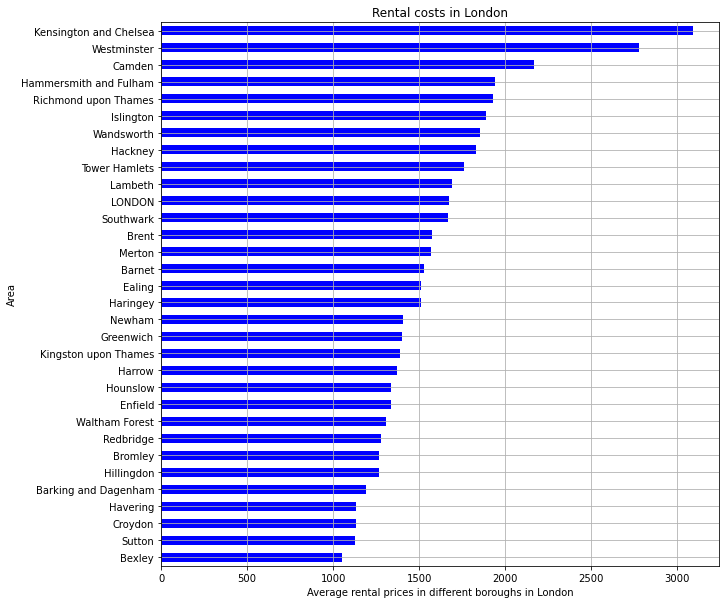

In [45]:
#Visualize crime data
Borough_rent.set_index('Area')['AvgMon'].sort_values().plot(kind='barh', grid=True, figsize=(10,10), color='blue')
plt.xlabel('Average rental prices in different boroughs in London')
plt.title('Rental costs in London')
plt.show()

In [46]:
# to show the bar figures in map we have to match the name of the columsn in Borough_rent dataframe with the imported 
#london.geojson file.
# names in the data frame
dataframenames = Borough_rent.Area.tolist()

# names in the json file - the same order as in the data frame 
geojson_names = ['Barking and Dagenham','Barnet','Bexley','Brent','Bromley','Camden','City of London',
                 'Ealing','Enfield','Greenwich','Hackney','Hammersmith and Fulham','Haringey',
                 'Harrow', 'Havering','Hillingdon','Hounslow','Islington','Kensington and Chelsea',
                 'Kingston upon Thames','Lambeth','Lewisham','Merton','Newham','Redbridge',
                 'Richmond upon Thames','Southwark','Sutton','Tower Hamlets','Waltham Forest','Wandsworth','Westminster','Croydon']
# replace data frame names by json names
Borough_rent.replace(zip(dataframenames, geojson_names), inplace=True)
Borough_rent

,Area,Average,AvgMon
0,Barking and Dagenham,3569,1189.666667
1,Barnet,4591,1530.333333
2,Bexley,3154,1051.333333
3,Brent,4731,1577.000000
4,Bromley,3794,1264.666667
5,Camden,6505,2168.333333
6,Croydon,3389,1129.666667
7,Ealing,4530,1510.000000
8,Enfield,4006,1335.333333
9,Greenwich,4206,1402.000000


In [47]:
# create a plain world map
rent_map = folium.Map(location=[51.5073219, -0.1276474], zoom_start=10, tiles='cartodbpositron')

# add tile layers to the map
tiles = ['stamenwatercolor','cartodbpositron','openstreetmap','stamenterrain']
for tile in tiles:
    folium.TileLayer(tile).add_to(rent_map)

# generate choropleth map 
choropleth =rent_map.choropleth(
    geo_data=communities_geo,
    data=Borough_rent,
    columns=['Area', 'AvgMon'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    nan_fill_color='#fed976',
    fill_opacity=1, 
    line_opacity=1,
    bins=[1000,1500,2000,2500,3000,3500],
    legend_name='Rental costs in Londnon boroughs ',
    smooth_factor=0)

# add labels with names 
for lat, lng, borough in zip(df['Latitude'], df['Longitude'], Borough_rent['Area']):
    label = '{}'.format(borough)
    label2 = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label2,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(rent_map) 

    
#create a layer control
folium.LayerControl().add_to(rent_map)
# display map
rent_map

c:\users\dalal\appdata\local\programs\python\python38\lib\site-packages\folium\folium.py:411: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


## Findings
As it seems the more you move from suburbs to the city center the higher the prices of renting. 
<li><b>Click on the circles to view the labels of boroughs</b>

## b. Cluster Analysis
In this part, we will conduct K-means clustering to group the boroughs according to what convenience facilities 
they have using Foursquare data.

In [48]:
print('There are {} uniques categories.'.format(len(venues['Venue Category'].unique())))

There are 181 uniques categories.


In [49]:
# One hot encoding before clustering
onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

In [50]:
# Add borough name back to dataframe
borough = venues['BoroughName']
onehot.insert(0, 'BoroughName', borough)
onehot.head()

,BoroughName,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,BBQ Joint,Bakery,Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bistro,Boarding House,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Station,Bus Stop,Butcher,Café,Cajun / Creole Restaurant,Caribbean Restaurant,Chaat Place,Champagne Bar,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Event Space,Farmers Market,Fast Food Restaurant,Film Studio,Fish Market,Flea Market,Food Court,French Restaurant,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,German Restaurant,Gift Shop,Golf Course,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hardware Store,Historic Site,History Museum,Hobby Shop,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Korean Restaurant,Latin American Restaurant,Light Rail Station,Liquor Store,Malay Restaurant,Market,Martial Arts Dojo,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Modern European Restaurant,Movie Theater,Multiplex,Museum,Music Store,Music Venue,New American Restaurant,Nightclub,Noodle House,Okonomiyaki Restaurant,Optical Shop,Organic Grocery,Outdoor Sculpture,Outlet Mall,Outlet Store,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Pharmacy,Pizza Place,Platform,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Pub,Rafting,Ramen Restaurant,Record Shop,Recording Studio,Restaurant,Road,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Shopping Mall,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Street Art,Street Food Gathering,Strip Club,Supermarket,Sushi Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Train Station,Turkish Restaurant,Used Bookstore,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Winery,Women's Store,Yoga Studio
0,Barking and Dagenham,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Barking and Dagenham,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Barking and Dagenham,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Barking and Dagenham,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [51]:
onehot.shape

(1140, 182)

In [52]:
# Group rows by borough and take the mean of frequency of each venue category
grouped = onehot.groupby('BoroughName').mean().reset_index()
grouped.head()

,BoroughName,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,BBQ Joint,Bakery,Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bistro,Boarding House,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Station,Bus Stop,Butcher,Café,Cajun / Creole Restaurant,Caribbean Restaurant,Chaat Place,Champagne Bar,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Event Space,Farmers Market,Fast Food Restaurant,Film Studio,Fish Market,Flea Market,Food Court,French Restaurant,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,German Restaurant,Gift Shop,Golf Course,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hardware Store,Historic Site,History Museum,Hobby Shop,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Korean Restaurant,Latin American Restaurant,Light Rail Station,Liquor Store,Malay Restaurant,Market,Martial Arts Dojo,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Modern European Restaurant,Movie Theater,Multiplex,Museum,Music Store,Music Venue,New American Restaurant,Nightclub,Noodle House,Okonomiyaki Restaurant,Optical Shop,Organic Grocery,Outdoor Sculpture,Outlet Mall,Outlet Store,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Pharmacy,Pizza Place,Platform,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Pub,Rafting,Ramen Restaurant,Record Shop,Recording Studio,Restaurant,Road,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Shopping Mall,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Street Art,Street Food Gathering,Strip Club,Supermarket,Sushi Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Train Station,Turkish Restaurant,Used Bookstore,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Winery,Women's Store,Yoga Studio
0,Barking and Dagenham,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.00,0.0,0.0,0.00,0.0,0.000000,0.0,0.142857,0.00,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.142857,0.0,0.00,0.0,0.142857,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.000000,0.0,0.00,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.142857,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.142857,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.142857,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.000000,0.0,0.0,0.0,0.0,0.142857,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
1,Barnet,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.00,0.0,0.0,0.00,0.0,0.000000,0.0,0.000000,0.25,0.0,0.500000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.0,0

In [53]:
# top 5 venues for each neighborhood
num_top_venues = 5

for hood in grouped['BoroughName']:
    print("----"+hood+"----")
    temp = grouped[grouped['BoroughName'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Barking and Dagenham----
                  venue  freq
0                  Park  0.14
1  Gym / Fitness Center  0.14
2                  Pool  0.14
3           Bus Station  0.14
4           Supermarket  0.14


----Barnet----
                venue  freq
0                Café  0.50
1            Bus Stop  0.25
2  Salon / Barbershop  0.25
3  African Restaurant  0.00
4    Pedestrian Plaza  0.00


----Bexley----
                  venue  freq
0                   Pub  0.10
1        Clothing Store  0.10
2           Coffee Shop  0.10
3  Fast Food Restaurant  0.06
4              Pharmacy  0.06


----Brent----
                 venue  freq
0          Coffee Shop  0.12
1                Hotel  0.10
2       Clothing Store  0.08
3        Grocery Store  0.06
4  Sporting Goods Shop  0.04


----Bromley----
                  venue  freq
0        Clothing Store  0.15
1           Coffee Shop  0.13
2          Burger Joint  0.05
3  Gym / Fitness Center  0.05
4           Pizza Place  0.05


----Camden----
    

In [54]:
# Put into pandas dataframe
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['BoroughName']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
venues_sorted = pd.DataFrame(columns=columns)
venues_sorted['BoroughName'] = grouped['BoroughName']

for ind in np.arange(grouped.shape[0]):
    venues_sorted.iloc[ind, 1:] = return_most_common_venues(grouped.iloc[ind, :], num_top_venues)

venues_sorted.head()


,BoroughName,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Barking and Dagenham,Golf Course,Pool,Bus Station,Supermarket,Gym / Fitness Center,Park,Martial Arts Dojo,Dumpling Restaurant,Fast Food Restaurant,Farmers Market
1,Barnet,Café,Salon / Barbershop,Bus Stop,Eastern European Restaurant,Fish Market,Film Studio,Fast Food Restaurant,Farmers Market,Event Space,English Restaurant
2,Bexley,Coffee Shop,Pub,Clothing Store,Pharmacy,Fast Food Restaurant,Furniture / Home Store,Supermarket,Italian Restaurant,Hotel,Bakery
3,Brent,Coffee Shop,Hotel,Clothing Store,Grocery Store,Sporting Goods Shop,American Restaurant,Sandwich Place,Bar,Plaza,Roof Deck
4,Bromley,Clothing Store,Coffee Shop,Pizza Place,Gym / Fitness Center,Burger Joint,Irish Pub,Sandwich Place,Café,Chocolate Shop,Pub


We will be using <b>K-Means</b> algorithm wich is one of the most common cluster method of unsupervised data.
<li>We will examin the optimal figure for k-Means in the following codes

In [55]:
# K Means Clustering
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors
# set number of clusters
kclusters = 2

grouped_clustering = grouped.drop('BoroughName', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(grouped_clustering)

# check cluster labels generated for each row in the dataframe
labels = kmeans.labels_
labels

array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

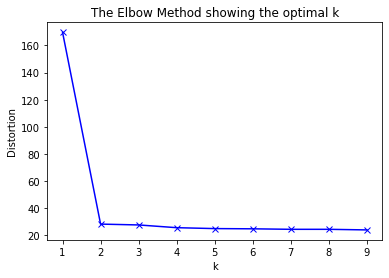

In [56]:
from scipy.spatial.distance import cdist

distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(grouped_clustering)
    #kmeanModel.fit(istanbul_grouped_clustering)
    distortions.append(sum(np.min(cdist(grouped_clustering, kmeanModel.cluster_centers_, 'canberra'), axis=1)) / grouped_clustering.shape[0])


# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()


In [57]:
# add clustering labels
venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

# merge toronto_grouped with toronto coords to add latitude/longitude for each neighborhood
london_merged = df
london_merged = london_merged.join(venues_sorted.set_index('BoroughName'), on='BoroughName')

london_merged.head()

,BoroughName,MonthlyAverage,Population,Latitude,Longitude,CrimeToPop,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Barking and Dagenham,1616.083333,194352,51.5607,0.1557,8.315239,1,Golf Course,Pool,Bus Station,Supermarket,Gym / Fitness Center,Park,Martial Arts Dojo,Dumpling Restaurant,Fast Food Restaurant,Farmers Market
1,Barnet,2494.875000,369088,51.6252,-0.1517,6.759567,0,Café,Salon / Barbershop,Bus Stop,Eastern European Restaurant,Fish Market,Film Studio,Fast Food Restaurant,Farmers Market,Event Space,English Restaurant
2,Bexley,1412.791667,236687,51.4549,0.1505,5.969029,1,Coffee Shop,Pub,Clothing Store,Pharmacy,Fast Food Restaurant,Furniture / Home Store,Supermarket,Italian Restaurant,Hotel,Bakery
3,Brent,2524.333333,317264,51.5588,-0.2817,7.956570,1,Coffee Shop,Hotel,Clothing Store,Grocery Store,Sporting Goods Shop,American Restaurant,Sandwich Place,Bar,Plaza,Roof Deck
4,Bromley,2009.791667,317899,51.4039,0.0198,6.322108,1,Clothing Store,Coffee Shop,Pizza Place,Gym / Fitness Center,Burger Joint,Irish Pub,Sandwich Place,Café,Chocolate Shop,Pub


Since the K-Means clustered Boroughs into two clusters, we have to find a name to each cluster.
By the following codes:

In [58]:
count_venue = london_merged
count_venue = count_venue.drop(['BoroughName','CrimeToPop'], axis=1)
count_venue = count_venue.groupby(['Cluster Labels','1st Most Common Venue']).size().reset_index(name='Counts')

#we can transpose it to plot bar chart
cv_cluster = count_venue.pivot(index='Cluster Labels', columns='1st Most Common Venue', values='Counts')
cv_cluster = cv_cluster.fillna(0).astype(int).reset_index(drop=True)
cv_cluster

1st Most Common Venue,Café,Caribbean Restaurant,Clothing Store,Coffee Shop,Fast Food Restaurant,Golf Course,Hotel,Indian Restaurant,Italian Restaurant,Juice Bar,Pub,Supermarket
0,2,0,0,0,0,0,0,0,0,0,0,0
1,1,1,3,8,1,1,2,1,2,1,8,1


Here we will create a bar-chart for each cluster to illustrate the venues in each cluster.

Text(0, 0.5, 'Clusters')

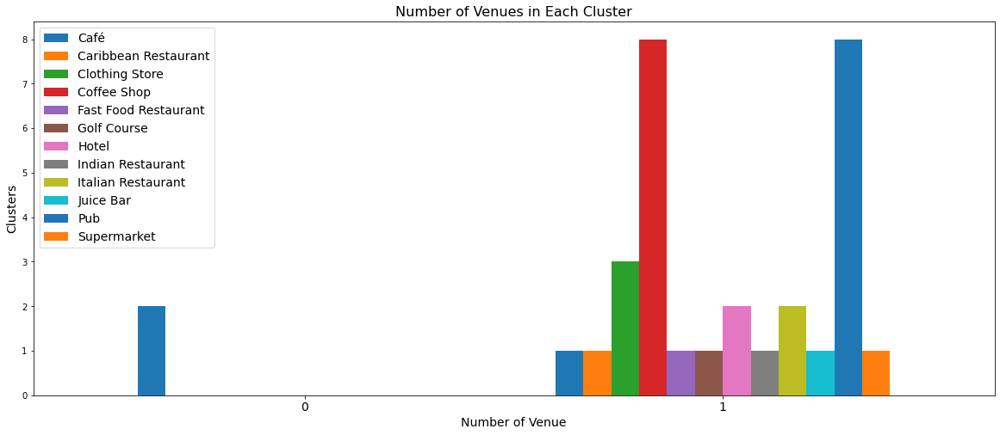

In [59]:
#creating a bar chart of "Number of Venues in Each Cluster"
frame=cv_cluster.plot(kind='bar',figsize=(20,8),width = 0.8)

plt.legend(labels=cv_cluster.columns,fontsize= 14)
plt.title("Number of Venues in Each Cluster",fontsize= 16)
plt.xticks(fontsize=14)
plt.xticks(rotation=0)
plt.xlabel('Number of Venue', fontsize=14)
plt.ylabel('Clusters', fontsize=14)

Well, now we can name each cluster as follows:</li>
<li>  cluster 0 = <b>Relaxing Boroughs</b> 
<li>  cluster 1 = <b>Busy Boroughs</b>

In [60]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11, tiles='cartodbpositron')

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged['Latitude'], london_merged['Longitude'], london_merged['BoroughName'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

 Now let's observe each clusters and name them according to their characteristics

In [61]:
# Cluster 0:#Relaxing Boroughs
london_merged.loc[london_merged['Cluster Labels'] == 0, london_merged.columns[[0] + list(range(5, london_merged.shape[1]))]]

,BoroughName,CrimeToPop,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Barnet,6.759567,0,Café,Salon / Barbershop,Bus Stop,Eastern European Restaurant,Fish Market,Film Studio,Fast Food Restaurant,Farmers Market,Event Space,English Restaurant
16,Hounslow,8.318185,0,Café,Park,Chinese Restaurant,Bed & Breakfast,Yoga Studio,Electronics Store,Flea Market,Fish Market,Film Studio,Fast Food Restaurant


In [62]:
# Cluster 1:#busy Boroughs
london_merged.loc[london_merged['Cluster Labels'] == 1, london_merged.columns[[0] + list(range(5, london_merged.shape[1]))]]

,BoroughName,CrimeToPop,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Barking and Dagenham,8.315239,1,Golf Course,Pool,Bus Station,Supermarket,Gym / Fitness Center,Park,Martial Arts Dojo,Dumpling Restaurant,Fast Food Restaurant,Farmers Market
2,Bexley,5.969029,1,Coffee Shop,Pub,Clothing Store,Pharmacy,Fast Food Restaurant,Furniture / Home Store,Supermarket,Italian Restaurant,Hotel,Bakery
3,Brent,7.956570,1,Coffee Shop,Hotel,Clothing Store,Grocery Store,Sporting Goods Shop,American Restaurant,Sandwich Place,Bar,Plaza,Roof Deck
4,Bromley,6.322108,1,Clothing Store,Coffee Shop,Pizza Place,Gym / Fitness Center,Burger Joint,Irish Pub,Sandwich Place,Café,Chocolate Shop,Pub
5,Camden,13.572016,1,Coffee Shop,Café,Hotel,Burger Joint,Breakfast Spot,Deli / Bodega,Pizza Place,Garden,Train Station,Modern European Restaurant
6,Croydon,7.374318,1,Coffee Shop,Pub,Portuguese Restaurant,Spanish Restaurant,Burger Joint,Bookstore,Museum,Food Court,Breakfast Spot,Brewery
7,Ealing,7.372635,1,Coffee Shop,Pizza Place,Hotel,Italian Restaurant,Vietnamese Restaurant,Burger Joint,Park,Pub,Polish Restaurant,Southern / Soul Food Restaurant
8,Enfield,7.656213,1,Clothing Store,Coffee Shop,Pub,Optical Shop,Bookstore,Shopping Mall,Sandwich Place,Supermarket,Video Game Store,Pharmacy
9,Greenwich,8.688184,1,Pub,Clothing Store,Fast Food Restaurant,Coffee Shop,Supermarket,Grocery Store,Pharmacy,Platform,Plaza,Hotel
10,Hackney,10.622953,1,Pub,Coffee Shop,Café,Bakery,Cocktail Bar,Hotel,Brewery,Vietnamese Restaurant,Vegetarian / Vegan Restaurant,Grocery Store


## 4. Results & Recommendation
Here we can analyze our findings based on the criteria of safety and rental cost in different boroughs in London.

#### 1) Safety measurment
In this criteria we have determin the rate of crimes in each boroughs taking in our consideratio the rate of population to the number of crimes for more accuracy.As have seen in 'CrimeToPop' column that describes the crime incidents for each 1000 residents from 2018 to 2019.

In [63]:
# In this table we can see in ascending order (higher to lower) boroughs in terms of crime incidents.
crimetopop = london_merged['CrimeToPop']
london_merged.drop(['CrimeToPop'], inplace=True, axis=1)
london_merged.insert(1, 'CrimeToPop', crimetopop)
london_merged.sort_values(by='CrimeToPop', ascending = False)

,BoroughName,CrimeToPop,MonthlyAverage,Population,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
31,Westminster,27.009557,6126.875000,226841,51.4973,-0.1372,1,Hotel,Coffee Shop,Theater,Sandwich Place,Sporting Goods Shop,Hotel Bar,Juice Bar,Sushi Restaurant,Breakfast Spot,Café
5,Camden,13.572016,3117.750000,229719,51.5290,-0.1255,1,Coffee Shop,Café,Hotel,Burger Joint,Breakfast Spot,Deli / Bodega,Pizza Place,Garden,Train Station,Modern European Restaurant
18,Kensington and Chelsea,12.480665,1941.916667,155594,51.5020,-0.1947,1,Juice Bar,Clothing Store,Café,Bakery,Gym / Fitness Center,Restaurant,Breakfast Spot,Burger Joint,Italian Restaurant,Sporting Goods Shop
17,Islington,11.327069,2442.875000,215667,51.5416,-0.1022,1,Pub,Bakery,Boutique,Ice Cream Shop,Mediterranean Restaurant,Music Venue,Burger Joint,Park,Theater,Dance Studio
10,Hackney,10.622953,2734.125000,257379,51.5450,-0.0553,1,Pub,Coffee Shop,Café,Bakery,Cocktail Bar,Hotel,Brewery,Vietnamese Restaurant,Vegetarian / Vegan Restaurant,Grocery Store
11,Hammersmith and Fulham,10.608986,1895.666667,178685,51.4927,-0.2339,1,Pub,Italian Restaurant,Indian Restaurant,Café,Vietnamese Restaurant,Japanese Restaurant,Gastropub,Clothing Store,Plaza,French Restaurant
26,Southwark,10.460502,3122.083333,298464,51.5035,-0.0804,1,Coffee Shop,Hotel,Pub,Bar,Hotel Bar,Gym / Fitness Center,Art Gallery,English Restaurant,Cocktail Bar,Theater
28,Tower Hamlets,10.456289,2853.416667,272890,51.5099,-0.0059,1,Italian Restaurant,Hotel,Coffee Shop,Pizza Place,Gym / Fitness Center,Café,Sandwich Place,Outdoor Sculpture,Chinese Restaurant,Light Rail Station
12,Haringey,9.959084,2623.083333,263386,51.6000,-0.1119,1,Fast Food Restaurant,Turkish Restaurant,Movie Theater,Café,Mediterranean Restaurant,Supermarket,Bar,Bakery,Grocery Store,Park
23,Newham,9.345137,2973.875000,318227,51.5077,0.0469,1,Hotel,Light Rail Station,Chinese Restaurant,Airport,Airport Lounge,Airport Service,Sandwich Place,Pharmacy,Rafting,English Restaurant


<li>According to the figure above the highest crime rates recorded in <b>Westminister, Cameden, Kensington and Chelsea</b></li>
<li>Whereas, the lower rates that has been recorded are in <b>Richmond upon Thames, Harrow and Sutton</b>  </li>

#### 2) Cost of renting accomodation:
Under this criteria,we have selected the average cost of renting for all categories of accomodation for the past 3 quarters of 2019 and 2018.

In [64]:
# we call up the Brorugh_rent table 
Borough_rent.rename(columns={'Area':'BoroughName'}, inplace=True)
Borough_rent.head()

,BoroughName,Average,AvgMon
0,Barking and Dagenham,3569,1189.666667
1,Barnet,4591,1530.333333
2,Bexley,3154,1051.333333
3,Brent,4731,1577.000000
4,Bromley,3794,1264.666667


In [65]:
# merge Borough_rent with london'-merged  to add latitude/longitude for each neighborhood
london_merged = Borough_rent
london_merged = london_merged.join(venues_sorted.set_index('BoroughName'), on='BoroughName')
london_merged

,BoroughName,Average,AvgMon,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Barking and Dagenham,3569,1189.666667,1.0,Golf Course,Pool,Bus Station,Supermarket,Gym / Fitness Center,Park,Martial Arts Dojo,Dumpling Restaurant,Fast Food Restaurant,Farmers Market
1,Barnet,4591,1530.333333,0.0,Café,Salon / Barbershop,Bus Stop,Eastern European Restaurant,Fish Market,Film Studio,Fast Food Restaurant,Farmers Market,Event Space,English Restaurant
2,Bexley,3154,1051.333333,1.0,Coffee Shop,Pub,Clothing Store,Pharmacy,Fast Food Restaurant,Furniture / Home Store,Supermarket,Italian Restaurant,Hotel,Bakery
3,Brent,4731,1577.000000,1.0,Coffee Shop,Hotel,Clothing Store,Grocery Store,Sporting Goods Shop,American Restaurant,Sandwich Place,Bar,Plaza,Roof Deck
4,Bromley,3794,1264.666667,1.0,Clothing Store,Coffee Shop,Pizza Place,Gym / Fitness Center,Burger Joint,Irish Pub,Sandwich Place,Café,Chocolate Shop,Pub
5,Camden,6505,2168.333333,1.0,Coffee Shop,Café,Hotel,Burger Joint,Breakfast Spot,Deli / Bodega,Pizza Place,Garden,Train Station,Modern European Restaurant
6,Croydon,3389,1129.666667,1.0,Coffee Shop,Pub,Portuguese Restaurant,Spanish Restaurant,Burger Joint,Bookstore,Museum,Food Court,Breakfast Spot,Brewery
7,Ealing,4530,1510.000000,1.0,Coffee Shop,Pizza Place,Hotel,Italian Restaurant,Vietnamese Restaurant,Burger Joint,Park,Pub,Polish Restaurant,Southern / Soul Food Restaurant
8,Enfield,4006,1335.333333,1.0,Clothing Store,Coffee Shop,Pub,Optical Shop,Bookstore,Shopping Mall,Sandwich Place,Supermarket,Video Game Store,Pharmacy
9,Greenwich,4206,1402.000000,1.0,Pub,Clothing Store,Fast Food Restaurant,Coffee Shop,Supermarket,Grocery Store,Pharmacy,Platform,Plaza,Hotel


In [66]:
# In this table we can see in ascending order (higher to lower) boroughs in terms of rental costs.
london_merged.sort_values(by='AvgMon', ascending = False)

,BoroughName,Average,AvgMon,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
18,Kensington and Chelsea,9263,3087.666667,1.0,Juice Bar,Clothing Store,Café,Bakery,Gym / Fitness Center,Restaurant,Breakfast Spot,Burger Joint,Italian Restaurant,Sporting Goods Shop
32,Westminster,8325,2775.000000,1.0,Hotel,Coffee Shop,Theater,Sandwich Place,Sporting Goods Shop,Hotel Bar,Juice Bar,Sushi Restaurant,Breakfast Spot,Café
5,Camden,6505,2168.333333,1.0,Coffee Shop,Café,Hotel,Burger Joint,Breakfast Spot,Deli / Bodega,Pizza Place,Garden,Train Station,Modern European Restaurant
11,Hammersmith and Fulham,5816,1938.666667,1.0,Pub,Italian Restaurant,Indian Restaurant,Café,Vietnamese Restaurant,Japanese Restaurant,Gastropub,Clothing Store,Plaza,French Restaurant
26,Richmond upon Thames,5787,1929.000000,1.0,Pub,Coffee Shop,Italian Restaurant,Indian Restaurant,Grocery Store,Bus Stop,Café,Pharmacy,Deli / Bodega,Sandwich Place
17,Islington,5659,1886.333333,1.0,Pub,Bakery,Boutique,Ice Cream Shop,Mediterranean Restaurant,Music Venue,Burger Joint,Park,Theater,Dance Studio
31,Wandsworth,5556,1852.000000,1.0,Pub,Coffee Shop,Clothing Store,Burger Joint,Pizza Place,Breakfast Spot,Supermarket,Asian Restaurant,Gym / Fitness Center,Indian Restaurant
10,Hackney,5485,1828.333333,1.0,Pub,Coffee Shop,Café,Bakery,Cocktail Bar,Hotel,Brewery,Vietnamese Restaurant,Vegetarian / Vegan Restaurant,Grocery Store
29,Tower Hamlets,5274,1758.000000,1.0,Italian Restaurant,Hotel,Coffee Shop,Pizza Place,Gym / Fitness Center,Café,Sandwich Place,Outdoor Sculpture,Chinese Restaurant,Light Rail Station
21,Lambeth,5068,1689.333333,1.0,Caribbean Restaurant,Market,Pub,Pizza Place,Cocktail Bar,Indian Restaurant,Restaurant,Beer Bar,BBQ Joint,Tapas Restaurant


<li>This shows us the most 3 expensive boroughs for renting are:<b>Kensington and Chelsea, Westminster and Camden </b><li/>
While the the 3 cheapest boroughs are: <b> Croydon, Sutton and Bexley<b> 

#### 3) Surroundings 

<li>For this analysis we will cluster each zone with its proper attribute.</li>
   <li>Starting with cluster 0 , the <b>best Boroughs for relaxing and those who are looking for less nosiy places </b> with lots of Theaters, Cinemas, Parks and Cafe.

In [67]:
london_merged.loc[london_merged['Cluster Labels'] == 0].BoroughName.unique()

array(['Barnet', 'Hounslow'], dtype=object)

<li> This cluster consist of resturants, Pups, coffe shopes <b> busy and crowded Boroughs</b>

In [68]:
london_merged.loc[london_merged['Cluster Labels'] == 1].BoroughName.unique()

array(['Barking and Dagenham', 'Bexley', 'Brent', 'Bromley', 'Camden',
       'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Hackney',
       'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering',
       'Hillingdon', 'Islington', 'Kensington and Chelsea',
       'Kingston upon Thames', 'Lambeth', 'Merton', 'Newham', 'Redbridge',
       'Richmond upon Thames', 'Southwark', 'Sutton', 'Tower Hamlets',
       'Waltham Forest', 'Wandsworth', 'Westminster'], dtype=object)

#### c. Weighted score table
At this section we can recommened the best boroughs based on our criteria: 

In [69]:
result = pd.concat([london_merged, crime], axis=1, sort=False)
result.head()

,BoroughName,Average,AvgMon,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,BoroughName,MonthlyAverage
0,Barking and Dagenham,3569,1189.666667,1.0,Golf Course,Pool,Bus Station,Supermarket,Gym / Fitness Center,Park,Martial Arts Dojo,Dumpling Restaurant,Fast Food Restaurant,Farmers Market,Barking and Dagenham,1616.083333
1,Barnet,4591,1530.333333,0.0,Café,Salon / Barbershop,Bus Stop,Eastern European Restaurant,Fish Market,Film Studio,Fast Food Restaurant,Farmers Market,Event Space,English Restaurant,Barnet,2494.875000
2,Bexley,3154,1051.333333,1.0,Coffee Shop,Pub,Clothing Store,Pharmacy,Fast Food Restaurant,Furniture / Home Store,Supermarket,Italian Restaurant,Hotel,Bakery,Bexley,1412.791667
3,Brent,4731,1577.000000,1.0,Coffee Shop,Hotel,Clothing Store,Grocery Store,Sporting Goods Shop,American Restaurant,Sandwich Place,Bar,Plaza,Roof Deck,Brent,2524.333333
4,Bromley,3794,1264.666667,1.0,Clothing Store,Coffee Shop,Pizza Place,Gym / Fitness Center,Burger Joint,Irish Pub,Sandwich Place,Café,Chocolate Shop,Pub,Bromley,2009.791667


In [70]:
crimerate=result['MonthlyAverage']
result.drop(labels=['MonthlyAverage'], axis=1, inplace=True)
result.insert(3,'MonthlyAverage',crimerate)
result.head()

,BoroughName,Average,AvgMon,MonthlyAverage,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,BoroughName
0,Barking and Dagenham,3569,1189.666667,1616.083333,1.0,Golf Course,Pool,Bus Station,Supermarket,Gym / Fitness Center,Park,Martial Arts Dojo,Dumpling Restaurant,Fast Food Restaurant,Farmers Market,Barking and Dagenham
1,Barnet,4591,1530.333333,2494.875000,0.0,Café,Salon / Barbershop,Bus Stop,Eastern European Restaurant,Fish Market,Film Studio,Fast Food Restaurant,Farmers Market,Event Space,English Restaurant,Barnet
2,Bexley,3154,1051.333333,1412.791667,1.0,Coffee Shop,Pub,Clothing Store,Pharmacy,Fast Food Restaurant,Furniture / Home Store,Supermarket,Italian Restaurant,Hotel,Bakery,Bexley
3,Brent,4731,1577.000000,2524.333333,1.0,Coffee Shop,Hotel,Clothing Store,Grocery Store,Sporting Goods Shop,American Restaurant,Sandwich Place,Bar,Plaza,Roof Deck,Brent
4,Bromley,3794,1264.666667,2009.791667,1.0,Clothing Store,Coffee Shop,Pizza Place,Gym / Fitness Center,Burger Joint,Irish Pub,Sandwich Place,Café,Chocolate Shop,Pub,Bromley


In [71]:
result
result.drop(result.columns[5:15], axis=1, inplace=True)
result.head()

,BoroughName,Average,AvgMon,MonthlyAverage,Cluster Labels,BoroughName
0,Barking and Dagenham,3569,1189.666667,1616.083333,1.0,Barking and Dagenham
1,Barnet,4591,1530.333333,2494.875000,0.0,Barnet
2,Bexley,3154,1051.333333,1412.791667,1.0,Bexley
3,Brent,4731,1577.000000,2524.333333,1.0,Brent
4,Bromley,3794,1264.666667,2009.791667,1.0,Bromley


#### 4) Findnig the Wieghted score for wach borough 

In [72]:
score = result[['BoroughName','AvgMon','MonthlyAverage','Cluster Labels']].copy()
score.head()

,BoroughName,BoroughName,AvgMon,MonthlyAverage,Cluster Labels
0,Barking and Dagenham,Barking and Dagenham,1189.666667,1616.083333,1.0
1,Barnet,Barnet,1530.333333,2494.875000,0.0
2,Bexley,Bexley,1051.333333,1412.791667,1.0
3,Brent,Brent,1577.000000,2524.333333,1.0
4,Bromley,Bromley,1264.666667,2009.791667,1.0


In [73]:
# remove duplicated columns
score = score.loc[:,~score.columns.duplicated()]
#create new columns for each scoring criteria
score['Safety'] = (score['MonthlyAverage']-score['MonthlyAverage'].min())/(score['MonthlyAverage'].max()-score['MonthlyAverage'].min())
score['Safety'] = (score['Safety'] - 1) * -1
score['renting'] = (score['AvgMon']-score['AvgMon'].min())/(score['AvgMon'].max()-score['AvgMon'].min())
score['renting'] = (score['renting'] - 1) * -1
score.head(5)

,BoroughName,AvgMon,MonthlyAverage,Cluster Labels,Safety,renting
0,Barking and Dagenham,1189.666667,1616.083333,1.0,0.890493,0.932067
1,Barnet,1530.333333,2494.875000,0.0,0.717007,0.764773
2,Bexley,1051.333333,1412.791667,1.0,0.930625,1.000000
3,Brent,1577.000000,2524.333333,1.0,0.711192,0.741856
4,Bromley,1264.666667,2009.791667,1.0,0.812769,0.895237


In [74]:
# setting a special marking to each cluster for the ease of calculating
score['surrounding'] = 0
for i in range(32):
    if score.iloc[i,3] == 0:
        score.iloc[i,6] = 1 #for uncroweded area
    elif score.iloc[i,3] == 1:
        score.iloc[i,6] = 0.8 # for busy area                
score.head()

,BoroughName,AvgMon,MonthlyAverage,Cluster Labels,Safety,renting,surrounding
0,Barking and Dagenham,1189.666667,1616.083333,1.0,0.890493,0.932067,0.8
1,Barnet,1530.333333,2494.875000,0.0,0.717007,0.764773,1.0
2,Bexley,1051.333333,1412.791667,1.0,0.930625,1.000000,0.8
3,Brent,1577.000000,2524.333333,1.0,0.711192,0.741856,0.8
4,Bromley,1264.666667,2009.791667,1.0,0.812769,0.895237,0.8


In [75]:
# Cleaning the dataframe and finalising the score
score.drop(['MonthlyAverage'], inplace=True, axis=1)
score.drop(['AvgMon'], inplace= True, axis=1)
score.drop(['Cluster Labels'], inplace=True, axis=1)
score['Score'] = score['Safety'] + score['renting']+ score['surrounding']
score.sort_values(by='Score', ascending = False)

,BoroughName,Safety,renting,surrounding,Score
28,Sutton,0.989340,0.962842,0.8,2.752181
2,Bexley,0.930625,1.000000,0.8,2.730625
14,Havering,0.901392,0.959568,0.8,2.660960
16,Hounslow,0.778625,0.859060,1.0,2.637685
19,Kingston upon Thames,1.000000,0.835816,0.8,2.635816
0,Barking and Dagenham,0.890493,0.932067,0.8,2.622560
13,Harrow,0.937017,0.842527,0.8,2.579544
23,Merton,0.976648,0.746603,0.8,2.523251
4,Bromley,0.812769,0.895237,0.8,2.508006
25,Redbridge,0.819300,0.887707,0.8,2.507007


## Conclusion
To conclude,based on our analysis and by relying on the determined criteria we have found that the best places to live and settle as for international students or expats are as the following:

In [76]:
Borough_top5 = df.iloc[[27,2,14,16,19],:]
Borough_top5

,BoroughName,MonthlyAverage,Population,Latitude,Longitude,CrimeToPop
27,Sutton,1115.375000,195914,51.3618,-0.1945,5.693187
2,Bexley,1412.791667,236687,51.4549,0.1505,5.969029
14,Havering,1560.875000,242080,51.5812,0.1837,6.447765
16,Hounslow,2182.750000,262407,51.4746,-0.3680,8.318185
19,Kingston upon Thames,1061.375000,166793,51.4085,-0.3064,6.363427


In [77]:
# make a map of London using folium

map = folium.Map(location=[51.5073219, -0.1276474], zoom_start=10, tiles='openstreetmap')

# add markers to map
for lat, lng, borough in zip(Borough_top5['Latitude'], Borough_top5['Longitude'], Borough_top5['BoroughName']):
    label = '{}'.format(borough)
    label2 = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label2,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map)  
    
map

##  Problems 
 Well at the end, we have to point out some limitation to my study. First of all, the rent prices and crime rates figures are only limited to certian period of time. Thus, more larger data are needed for more accuracy of the figures. In additon, it seems that the best boroughs based on the explained criteria are near to the suburbs of the city of London and somehow far from the city center. It bring backs the dilemma of setteling in the center of mega-cities and I think it is the same issue globally that has been derived based on many concepts.However, considering the well-designed transportation services in a city like London, living in the suburbs does not seem to be an issue. 
Besides, other deeper critera can be considered in terms of renting prices. Since, I have considered all accomodation based on average figures. Thus, considering a specific type of accomodation can lead to a more accurate study.
